In [ ]:
#magnitude path should be updated in below code.To give magnitude path.

In [ ]:
!pip -q install einops

In [2]:

import torch

def _make_arg_str(arg):
    arg = str(arg)
    too_big = len(arg) > 15 or "\n" in arg
    return "..." if too_big else arg


def _extract_act_pos(acts, h=None, w=None):
    shape = acts.shape
    h = shape[3] // 2 if h is None else h
    w = shape[4] // 2 if w is None else w
    return acts[: ,:, :, h:h+1, w:w+1]


def batch_transform_handler(transform_func, batch_index=None):
    """
    Handle batching for a transformation function.

    Args:
        transform_func (callable): The transformation function to be applied.
        batch_index (int, optional): The specific batch index to handle. If None, handle all batches. Defaults to None.

    Returns:
        callable: A function that applies the transformation to the specified batch or all batches.
    """
    def apply_transform(name):
        """
        Apply the transformation to the specified batch or all batches.

        Args:
            name (str): The name of the transformation.

        Returns:
            torch.Tensor: The transformed tensor.
        """
        transformed_tensor = transform_func(name)
        if isinstance(batch_index, int):
            return transformed_tensor[:, batch_index:batch_index + 1]
        else:
            return transformed_tensor
        
    return apply_transform


def linconv_reshape(x,ref):
    #reshapes x to shape of y where x is shape (c) or (b,c) and y is either shape (b,c) or (b,c,h,w)
    if x.dim() == 1: x = x.unsqueeze(0)
    while x.dim() < ref.dim():
        x = x.unsqueeze(dim=-1)
    return x



    


In [3]:


from __future__ import absolute_import, division, print_function

import numpy as np
import torch
import torch.nn.functional as F
from decorator import decorator


class Objective():

    def __init__(self, objective_func, name="", description=""):
        self.objective_func = objective_func
        self.name = name
        self.description = description

    def __call__(self, model):
        return self.objective_func(model)



def wrap_objective():
    @decorator
    def inner(func, *args, **kwds):
        objective_func = func(*args, **kwds)
        objective_name = func.__name__
        args_str = " [" + ", ".join([_make_arg_str(arg) for arg in args]) + "]"
        description = objective_name.title() + args_str
        return Objective(objective_func, objective_name, description)
    return inner


def handle_batch(batch=None):
    return lambda f: lambda model: f(batch_transform_handler(model, batch_index=batch))


@wrap_objective()
def neuron(layer, unit, h=None, w=None, batch=None):
    """Visualize a specific neuron in a specific layer"""
    @handle_batch(batch)
    def inner(model):
        layer_t = model(layer)
        layer_t = _extract_act_pos(layer_t, h, w)
        return -layer_t[:, :, unit].mean()

    return inner

@wrap_objective()
def channel(layer, unit, batch=None):
    """Visualize a single channel"""
    @handle_batch(batch)
    def inner(model):
        return -model(layer)[:, :, unit].mean()

    return inner


@wrap_objective()
def layer(layer_name, batch=None):
    """Visualize an entire layer."""
    @handle_batch(batch)
    def inner(model):
        layer_t = model(layer_name)
        return -layer_t.mean()

    return inner

def as_objective(obj):
    if isinstance(obj, Objective):
        return obj
    if callable(obj):
        return obj
    if isinstance(obj, str):
        parts = obj.split(":")
        if len(parts) == 2:
            layer_name, chn = parts[0].strip(), int(parts[1])
            return channel(layer_name, chn)
        elif len(parts) == 1:
            layer_name = parts[0].strip()
            return layer(layer_name)


    
    
@wrap_objective()
def l2_compare(layer, batch=0,comp_batch=1,p=2, pos=None):
  def inner(T, pos= pos):
    x = T(layer) # model output, with additional transform dimension
    x1 = x[:,batch]
    x2 = x[:,comp_batch]
    distances = torch.norm(x1-x2,dim=1,p=p)

    if pos is not None:
        if pos is 'middle':
            pos = [distances.shape[1]//2,distances.shape[2]//2]
        distances = distances[:, pos[0], pos[1]]
    return -distances.mean()
  return inner







<>:99: SyntaxWarning: "is" with a literal. Did you mean "=="?
<>:99: SyntaxWarning: "is" with a literal. Did you mean "=="?
/tmp/ipykernel_34/2241263877.py:99: SyntaxWarning: "is" with a literal. Did you mean "=="?
  if pos is 'middle':


In [4]:

default_model_input_size = (224,224)
default_img_size = (512,512) #size of visualizations
#NOTE: inceptionv1 range is [-117, 138], imagenet default is roughly [-2,2]
default_model_input_range = (-2,2) # range of values model expects


def plot_alpha(image_tensor, alpha_tensor, percentile=10, save_output=False, display_output=True, blur_strength=2, cropping_area=None, figure_size=(10, 10)):
    """
    Remove outliers and plot images with transparency (alpha) channels.

    Args:
        image_tensor (torch.Tensor): Tensor of images to be processed and displayed. 
                                     Shape should be (N, C, H, W) or (C, H, W) where N is the number of images,
                                     C is the number of channels, H is height, and W is width.
        alpha_tensor (torch.Tensor): Tensor of alpha (transparency) channels corresponding to the images.
                                     Shape should match image_tensor.
        percentile (int, optional): Percentile value for clipping to remove outliers in the alpha channel. Defaults to 10.
        save_output (bool, optional): Whether to save the output images as files. Defaults to False.
        display_output (bool, optional): Whether to display the output images. Defaults to True.
        blur_strength (float, optional): Sigma value for Gaussian blur applied to the alpha channel. Defaults to 2.
        cropping_area (tuple, optional): Tuple specifying the cropping area in the format ((y1, y2), (x1, x2)). 
                                         If None, no cropping is applied. Defaults to None.
        figure_size (tuple, optional): Size of the figure for displaying images. Defaults to (10, 10).

    Returns:
        None
    """
    image_array = torch_to_numpy(image_tensor)
    alpha_array = torch_to_numpy(alpha_tensor)

    # Handle single image
    if len(image_array.shape) == 3:
        image_array = image_array[np.newaxis, ...]
        alpha_array = alpha_array[np.newaxis, ...]

    num_images = image_array.shape[0]
    figure, axis_list = plt.subplots(1, num_images, figsize=(figure_size[0] * num_images, figure_size[1]))

    if num_images == 1:
        axis_list = [axis_list]  # Make it iterable if there's only one subplot

    for idx in range(num_images):
        current_image = image_array[idx]
        current_alpha = alpha_array[idx]

        if current_alpha.shape[0] == 1:
            current_alpha = np.moveaxis(current_alpha, 0, -1)

        # Normalize image
        current_image -= current_image.mean()
        current_image /= current_image.std()
        current_image -= current_image.min()
        current_image /= current_image.max()

        # Process alpha channel
        current_alpha = np.mean(np.array(current_alpha).copy(), -1, keepdims=True)
        current_alpha = clip_percentile(current_alpha, percentile)
        current_alpha = current_alpha / current_alpha.max()

        # Blur alpha channel
        current_alpha = current_alpha.squeeze()
        current_alpha = gaussian_filter(current_alpha, sigma=blur_strength)
        current_alpha = current_alpha[:, :, np.newaxis]

        if cropping_area is None:
            axis_list[idx].imshow(np.concatenate([current_image, current_alpha], -1))
        else:
            cropped_image = current_image[cropping_area[0][0]:cropping_area[0][1], cropping_area[1][0]:cropping_area[1][1]]
            cropped_alpha = current_alpha[cropping_area[0][0]:cropping_area[0][1], cropping_area[1][0]:cropping_area[1][1]]
            axis_list[idx].imshow(np.concatenate([cropped_image, cropped_alpha], -1))

        axis_list[idx].axis('off')

        if save_output:
            plt.savefig(f'output_image_{idx}.png', bbox_inches='tight')

    if display_output:
        plt.show()
    plt.close()


def plot(image_tensor, clip_percent=0.1, normalize=True):
    """
    Remove outliers and plot image(s).

    Args:
        image_tensor (torch.Tensor): Tensor of image(s) to be processed and displayed. 
                                     Shape can be (N, C, H, W) or (C, H, W) where N is the number of images,
                                     C is the number of channels, H is height, and W is width.
        clip_percent (float, optional): Percentile value for clipping to remove outliers. If None, no clipping is applied. Defaults to 0.1.
        normalize (bool, optional): Whether to normalize the images. Defaults to True.

    Returns:
        None
    """
    image_array = torch_to_numpy(image_tensor)
    
    if len(image_array.shape) == 3:
        if clip_percent is not None:
            image_array = clip_percentile(image_array, clip_percent)
        if normalize:
            image_array -= image_array.mean()
            image_array /= image_array.std()
            image_array -= image_array.min()
            image_array /= image_array.max()
        plt.imshow(image_array)
        plt.axis('off')
    else:
        num_images = image_array.shape[0]
        for idx in range(num_images):
            plt.subplot(1, num_images, idx + 1)
            current_image = image_array[idx]
            if clip_percent is not None:
                current_image = clip_percentile(current_image, clip_percent)
            if normalize:
                current_image -= current_image.mean()
                current_image /= current_image.std()
                current_image -= current_image.min()
                current_image /= current_image.max()

            plt.imshow(current_image)
            plt.axis('off')

        plt.show()

In [5]:

def box_crop_2(box_min_size=0.05, box_max_size=0.99):
    """
    Apply a random crop to an image tensor within specified size bounds.

    Args:
        box_min_size (float, optional): Minimum size of the crop box as a fraction of the image dimensions. Defaults to 0.05.
        box_max_size (float, optional): Maximum size of the crop box as a fraction of the image dimensions. Defaults to 0.99.

    Returns:
        function: A function that applies the random crop to an image tensor.
    """
    def inner(image_tensor):
        """
        Perform a random crop on the given image tensor.

        Args:
            image_tensor (torch.Tensor): Tensor of image(s) to be cropped. Shape should be (B, C, W, H) where
                                         B is batch size, C is the number of channels, W is width, and H is height.

        Returns:
            torch.Tensor: The cropped image tensor.
        """
        image = image_tensor
        batch_size, num_channels, image_width, image_height = image.shape

        # Sample box size uniformly in [min_size, max_size]
        box_width_fraction = torch.rand(1) * (box_max_size - box_min_size) + box_min_size
        box_height_fraction = box_width_fraction

        # Sample top-left corner x0, y0 uniformly from 'in bounds' regions
        max_x0_fraction = 1 - box_width_fraction
        max_y0_fraction = 1 - box_height_fraction
        x0_fraction = torch.rand(1) * max_x0_fraction
        y0_fraction = torch.rand(1) * max_y0_fraction

        # Calculate pixel coordinates for the crop
        x_start = int(x0_fraction * image_width)
        x_end = int((x0_fraction + box_width_fraction) * image_width)
        y_start = int(y0_fraction * image_height)
        y_end = int((y0_fraction + box_height_fraction) * image_height)

        # Crop image
        cropped_image = image[:, :, x_start:x_end, y_start:y_end]

        return cropped_image

    return inner


def uniform_gaussian_noise(noise_std=0.02):
    """
    Add uniform and Gaussian noise to an image tensor.

    Args:
        noise_std (float, optional): Standard deviation of the noise to be added. Defaults to 0.02.

    Returns:
        function: A function that adds the specified noise to an image tensor.
    """
    def inner(image_tensor):
        """
        Add uniform and Gaussian noise to the given image tensor.

        Args:
            image_tensor (torch.Tensor): Tensor of image(s) to which noise will be added. Shape should be (B, C, H, W) where
                                         B is batch size, C is the number of channels, H is height, and W is width.

        Returns:
            torch.Tensor: The image tensor with added noise.
        """
        batch_size = image_tensor.shape[0]
        device = image_tensor.device

        # Generate Gaussian noise
        gaussian_noise = torch.normal(mean=0.0, std=noise_std, size=image_tensor[0].shape).to(device)
        gaussian_noise = gaussian_noise.unsqueeze(0).repeat(batch_size, 1, 1, 1)

        # Generate uniform noise
        uniform_noise = (torch.rand_like(image_tensor[0], dtype=torch.float32) - 0.5) * noise_std
        uniform_noise = uniform_noise.unsqueeze(0).repeat(batch_size, 1, 1, 1)

        # Add noise to the image tensor
        noisy_image_tensor = image_tensor + gaussian_noise + uniform_noise

        return noisy_image_tensor
    
    return inner



standard_box_transforms = [
                           box_crop_2(),
                           uniform_gaussian_noise()
                          ]


def resize(target_size=default_model_input_size):
    """
    Resize an image tensor to the specified size.

    Args:
        target_size (tuple, optional): The target size for resizing the image tensor. Defaults to default_model_input_size.

    Returns:
        function: A function that resizes the image tensor to the specified size.
    """
    def inner(image_tensor):
        """
        Resize the given image tensor to the specified size.

        Args:
            image_tensor (torch.Tensor): Tensor of image(s) to be resized. Shape should be (B, C, H, W) where
                                         B is batch size, C is the number of channels, H is height, and W is width.

        Returns:
            torch.Tensor: The resized image tensor.
        """
        resized_image_tensor = F.interpolate(
            image_tensor,
            size=target_size,
            mode="bilinear",
            align_corners=True,
            antialias=True
        )
        return resized_image_tensor

    return inner


def range_normalize(normalization_range=default_model_input_range):
    """
    Normalize an image tensor to a specified range.

    Args:
        normalization_range (tuple, optional): The target range for normalization (min, max). Defaults to default_model_input_range.

    Returns:
        function: A function that normalizes the image tensor to the specified range.
    """
    def inner(image_tensor):
        """
        Normalize the given image tensor to the specified range.

        Args:
            image_tensor (torch.Tensor): Tensor of image(s) to be normalized. Shape should be (B, C, H, W) where
                                         B is batch size, C is the number of channels, H is height, and W is width.

        Returns:
            torch.Tensor: The normalized image tensor.
        """
        return image_tensor * (normalization_range[1] - normalization_range[0]) + normalization_range[0]
    
    return inner



def rebatch_transforms(tensor, num_transforms=1):
    """
    Add an extra dimension for transform batches.

    Args:
        tensor (torch.Tensor): The input tensor to be reshaped. Shape should be (N, C, H, W) where
                               N is batch size, C is the number of channels, H is height, and W is width.
        num_transforms (int, optional): The number of transform batches. Defaults to 1.

    Returns:
        torch.Tensor: The reshaped tensor with an added dimension for transform batches.
    """
    original_shape = list(tensor.shape)
    new_shape = [num_transforms, original_shape[0] // num_transforms] + original_shape[1:]
    reshaped_tensor = tensor.view(*new_shape)
    return reshaped_tensor


def compose(transformations, num_transforms=1):
    """
    Compose multiple transformations and apply them to an input tensor.

    Args:
        transformations (list): A list of transformation functions to be applied sequentially.
        num_transforms (int, optional): The number of times to apply the composed transformations. Defaults to 1.

    Returns:
        function: A function that applies the composed transformations to an input tensor.
    """
    def inner(input_tensor):
        """
        Apply the composed transformations to the input tensor.

        Args:
            input_tensor (torch.Tensor): The input tensor to which the transformations will be applied. Shape can vary.

        Returns:
            torch.Tensor: The transformed tensor.
        """
        def apply_transformations(tensor):
            """
            Apply each transformation in the list to the tensor sequentially.

            Args:
                tensor (torch.Tensor): The tensor to be transformed.

            Returns:
                torch.Tensor: The transformed tensor.
            """
            for transformation in transformations:
                tensor = transformation(tensor)
            return tensor

        # Apply the transformations multiple times if specified
        if num_transforms > 1:
            transformed_tensors = [apply_transformations(input_tensor) for _ in range(num_transforms)]
            return torch.cat(transformed_tensors, dim=0)
        else:
            return apply_transformations(input_tensor)

    return inner

In [6]:
from torchvision.transforms import Compose,Resize,ToTensor

totensor = ToTensor()

def img_to_img_tensor(image, target_size=default_img_size, crop=True):
    """
    Convert an image to a tensor and resize it to the specified size.

    Args:
        image (str or PIL.Image or torch.Tensor): The input image. Can be a file path, a PIL image, or a torch tensor.
        target_size (tuple, optional): The target size for resizing the image. Defaults to default_img_size.
        crop (bool, optional): Whether to crop the image before resizing. Defaults to True.

    Returns:
        torch.Tensor: The image converted to a tensor and resized to the target size.
    """
    if isinstance(image, str):
        image = Image.open(os.path.abspath(image))
        if image.mode == 'RGBA':
            image = image.convert('RGB')
        if image.mode == 'L':
            image = image.convert('RGB')  # Convert grayscale to RGB

    if not isinstance(image, torch.Tensor): 
        image = totensor(image)

    if image.dim() == 3: 
        image = image.unsqueeze(0)  # Shape now is (1, C, H, W)

    # Use interpolate to resize
    resized_image_tensor = F.interpolate(image, size=target_size).clamp(min=0.0, max=1.0)
    
    return resized_image_tensor




class FourierPhase:
    """
    A class to handle Fourier phase transformations on images with magnitude constraints.

    Args:
        init_image (str or PIL.Image or torch.Tensor, optional): Initial image to initialize the parameters.
        forward_init_image (bool, optional): Whether to forward the initial image. Defaults to False.
        image_size (tuple, optional): Target size for images. Defaults to default_img_size.
        device (torch.device, optional): Device to use for computations. Defaults to None.
        batch_size (int, optional): Batch size. Defaults to 1.
        desaturation (float, optional): Desaturation factor. Defaults to 1.0.
        seed (int, optional): Random seed for initialization. Defaults to None.
        normalize_image (bool, optional): Whether to normalize the image. Defaults to None.
        normalize_phase (bool, optional): Whether to normalize the phase. Defaults to None.
        magnitude_spectrum_border (bool, optional): Whether to use magnitude spectrum border. Defaults to False.
        use_magnitude_alpha (bool, optional): Whether to use magnitude alpha. Defaults to None.
        copy_batch (bool, optional): Whether to copy the batch. Defaults to False.
        magnitude_alpha_init (float, optional): Initial value for magnitude alpha. Defaults to 5.0.
        color_decorrelate (bool, optional): Whether to decorrelate colors. Defaults to True.
        correlation_file_path (str, optional): Path to the correlation file. Defaults to "/kaggle/input/mini-007/imagenet_decorrelated.npy".
        name (str, optional): Name of the instance. Defaults to 'fourier_phase'.

    Returns:
        FourierPhase: An instance of the FourierPhase class.
    """

    def __init__(self,
                 init_image=None,
                 forward_init_image=False,
                 image_size=default_img_size,
                 device=None,
                 batch_size=1,
                 desaturation=1.0,
                 seed=None,
                 normalize_image=None,
                 normalize_phase=None,
                 magnitude_spectrum_border=False,
                 use_magnitude_alpha=None,
                 copy_batch=False,
                 magnitude_alpha_init=5.0,
                 color_decorrelate=True,
                 correlation_file_path="/kaggle/input/mini-007/imagenet_decorrelated.npy",
                 name='fourier_phase'):
        
        self.name = name
        self.correlation_file_path = correlation_file_path
        self.image_size = image_size
        self.batch_size = batch_size
        self.desaturation = desaturation
        self.forward_init_image = forward_init_image
        self.magnitude_spectrum_border = magnitude_spectrum_border
        self.color_decorrelate = color_decorrelate
        self.copy_batch = copy_batch

        if normalize_image is None:
            normalize_image = init_image is None
        if normalize_phase is None:
            normalize_phase = init_image is None
        if use_magnitude_alpha is None:
            use_magnitude_alpha = init_image is not None

        self.normalize_image = normalize_image
        self.normalize_phase = normalize_phase
        self.use_magnitude_alpha = use_magnitude_alpha
        self.magnitude_alpha_init = magnitude_alpha_init
        self.seed = seed

        if device is None:
            device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')
        self.device = device

        if init_image is None:
            self.init_image = init_image
        else:
            self.init_image = img_to_img_tensor(init_image, size=self.image_size).to(self.device)

        # Initialize parameters
        if init_image is None:
            print('No image specified, initializing with random phase and magnitude from "imagenet_decorrelated.npy".')
            self.random_init()
            self.standard_transforms = [box_crop(box_min_size=0.05, box_max_size=0.5, box_loc_std=0.1),
                                        uniform_gaussian_noise()]
        else:
            self.img_to_params(init_image)
            self.standard_transforms = standard_box_transforms

    def random_init(self, img_size=None):
        """
        Initialize random phase and load magnitude from a file.

        Args:
            img_size (tuple, optional): Size of the image. Defaults to None.
        """
        if img_size is None:
            img_size = self.image_size

        buffer_shape = (img_size[0], 1 + (img_size[1] // 2))

        if self.seed is not None:
            np.random.seed(self.seed)
        
        phase = torch.tensor(np.random.uniform(low=-np.pi, high=np.pi, size=(self.batch_size, 3) + buffer_shape), dtype=torch.float32).to(self.device)

        if self.copy_batch:
            single_phase = np.random.uniform(low=-np.pi, high=np.pi, size=(3,) + buffer_shape)
            phase = torch.tensor(single_phase, dtype=torch.float32).unsqueeze(0).repeat(self.batch_size, 1, 1, 1).to(self.device)

        magnitude = torch.stack([torch.tensor(np.load(self.correlation_file_path), dtype=torch.float32).to(self.device) for _ in range(self.batch_size)])

        magnitude = F.interpolate(magnitude, buffer_shape, mode="bilinear", align_corners=True, antialias=True) * ((magnitude.shape[-2] * magnitude.shape[-1]) / (buffer_shape[0] * buffer_shape[1]))
        
        self.magnitude = magnitude 
        self.params = [phase]

        if self.use_magnitude_alpha:
            mag_alpha = self.magnitude_alpha_init * torch.ones(magnitude.shape).to(self.device)
            self.params.append(mag_alpha)

    def img_to_params(self, img):
        """
        Convert an image in pixel space to polar coordinate frequency domain.

        Args:
            img (str or PIL.Image or torch.Tensor): The image in pixel space.

        Returns:
            list: List containing phase tensor and optionally magnitude alpha tensor.
        """
        img = img_to_img_tensor(img, size=self.image_size).to(self.device)
        if self.magnitude_spectrum_border:
            self.random_init(img_size=(self.image_size[0] * 4, self.image_size[1] * 4))
            noise_img = self.params_to_img()
            img = center_paste(img, noise_img, blur_radius=int(self.image_size[0] / 50))

        img = safe_logit(img)

        if self.color_decorrelate:
            img = decorrelate_colors(img)

        img *= self.desaturation

        buffer = torch.fft.rfft2(img)
        
        magnitude = torch.abs(buffer)
        phase = torch.atan2(buffer.imag, buffer.real)

        if self.normalize_phase:
            phase = phase * (torch.std(phase) + 1e-4) + torch.mean(phase)

        phase = phase.repeat(self.batch_size, 1, 1, 1)
        magnitude = magnitude.repeat(self.batch_size, 1, 1, 1)

        self.magnitude = magnitude 
        self.params = [phase]

        if self.use_magnitude_alpha:
            mag_alpha = self.magnitude_alpha_init * torch.ones(magnitude.shape).to(self.device)
            self.params.append(mag_alpha)

        return self.params

    def params_to_img(self):
        """
        Convert the buffer in frequency domain to spatial domain.

        Returns:
            torch.Tensor: The image in pixel space.
        """
        phase = self.params[0]
        magnitude = self.magnitude
        if self.use_magnitude_alpha:
            magnitude = magnitude * torch.sigmoid(self.params[1])

        buffer = torch.complex(torch.cos(phase) * magnitude, torch.sin(phase) * magnitude)
        
        img = torch.fft.irfft2(buffer)
        img = img / self.desaturation

        if self.color_decorrelate:
            img = recorrelate_colors(img)

        if self.normalize_image:
            img = img - torch.mean(img, dim=(1, 2, 3), keepdim=True)
            img = img / (torch.std(img, dim=(1, 2, 3), keepdim=True) + 1e-4)

        img = torch.sigmoid(img)

        if self.magnitude_spectrum_border:
            crop = CenterCrop(self.image_size)
            img = crop(img)

        return img
    
    def __call__(self):
        """
        Return the parameters and an image generation function.

        Returns:
            tuple: A tuple containing the parameters and an image generation function.
        """
        if self.forward_init_image:
            img_func = lambda: torch.cat([self.params_to_img(), self.init_image], dim=0)
        else:
            img_func = self.params_to_img
        return self.params, img_func





In [7]:
import torch
import torch.nn.functional as F
import numpy as np
from tqdm import tqdm
import warnings





def render(
    model,
    objective,
    parameterizer=None,
    transformations=None,
    optimizer_function=None,
    output_thresholds=range(0, 200, 2),
    inline_thresholds=range(0, 200, 10),
    transparency_percentile=20,
    num_transformations=16,
    initial_image=None,
    verbose=False,
    preprocess=True,
    show_progress=True,
    image_transform_objective=None,
    regularize_for_image_transform=False,
    model_input_size=None,
    model_input_range=None,
    image_size=None,
    hook_layers=None,
    accentuation_reg_layer=None,
    accentuation_reg_alpha=None,
    activation_cutoff=None,
    simple_transformations=None,
    pgd_alpha=None
):
    """
    Render images by optimizing the given objective function.

    Args:
        model (torch.nn.Module): The model to be used for rendering.
        objective (callable): The objective function to be optimized.
        parameterizer (callable, optional): The parameterizer for image generation. Defaults to None.
        transformations (list, optional): List of transformations to be applied. Defaults to None.
        optimizer_function (callable, optional): The optimizer function. Defaults to None.
        output_thresholds (range, optional): Thresholds for saving output images. Defaults to range(0, 200, 2).
        inline_thresholds (range, optional): Thresholds for inline plotting. Defaults to range(0, 200, 10).
        transparency_percentile (int, optional): Percentile for transparency. Defaults to 20.
        num_transformations (int, optional): Number of transformations to apply. Defaults to 16.
        initial_image (torch.Tensor or str, optional): Initial image for parameterization. Defaults to None.
        verbose (bool, optional): Whether to print verbose output. Defaults to False.
        preprocess (bool, optional): Whether to apply preprocessing. Defaults to True.
        show_progress (bool, optional): Whether to show progress bar. Defaults to True.
        image_transform_objective (callable, optional): Objective for image transformation. Defaults to None.
        regularize_for_image_transform (bool, optional): Whether to regularize for image transformation. Defaults to False.
        model_input_size (tuple, optional): Input size for the model. Defaults to None.
        model_input_range (tuple, optional): Input range for the model. Defaults to None.
        image_size (tuple, optional): Size of the generated images. Defaults to None.
        hook_layers (list, optional): Layers to hook for feature extraction. Defaults to None.
        accentuation_reg_layer (str, optional): Layer for accentuation regularization. Defaults to None.
        accentuation_reg_alpha (float, optional): Alpha value for accentuation regularization. Defaults to None.
        activation_cutoff (float, optional): Cutoff for activation. Defaults to None.
        simple_transformations (list, optional): Simple transformations to apply. Defaults to None.
        pgd_alpha (float, optional): Alpha value for PGD. Defaults to None.

    Returns:
        tuple: A tuple containing:
            - imgs (list): List of generated images.
            - img_trs (list): List of image transformations.
            - losses (list): List of losses.
            - img_tr_losses (list): List of image transformation losses.
    """
    device = next(model.parameters()).device

    if len(inline_thresholds) >= 1:
        inline_thresholds = list(inline_thresholds)
        inline_thresholds.append(max(output_thresholds))

    if model_input_size is None:
        try:
            model_input_size = model.model_input_size
        except:
            print(f'warning: arg "model_input_size" not set, using default {default_model_input_size}')
            model_input_size = default_model_input_size

    if model_input_range is None:
        try:
            model_input_range = model.model_input_range
        except:
            print(f'warning: arg "model_input_range" not set, using default {default_model_input_range}')
            model_input_range = default_model_input_range

    if image_size is None:
        image_size = default_img_size

    if parameterizer is None:
        parameterizer = FourierPhase(device=device, image_size=image_size, init_image=initial_image)

    if initial_image is not None:
        print(f'Initializing parameterization with {initial_image}')

    if accentuation_reg_layer is not None:
        if accentuation_reg_alpha is None:
            print('Accentuation reg_layer arg set, but not reg_alpha, using reg_alpha=1')
            accentuation_reg_alpha = 1.0
        parameterizer.forward_init_img = True

    if accentuation_reg_alpha is not None and accentuation_reg_layer is None:
        print('arg reg_alpha set, but not reg_layer, you must set reg_layer! Applying no regularization.')

    params, img_f = parameterizer()
    for p in params:
        p.requires_grad_(True)

    for p in model.parameters():
        p.requires_grad = False

    if optimizer_function is None:
        if pgd_alpha is None:
            optimizer_function = lambda parameters: torch.optim.Adam(parameters, lr=0.05)
        else:
            optimizer_function = lambda parameters: torch.optim.SGD(parameters, lr=0.05)

    optimizer = optimizer_function(params)

    if transformations is None:
        try:
            print('Using parameterizer.standard_transforms')
            transformations = parameterizer.standard_transforms.copy()
        except:
            transformations = transform.standard_box_transforms.copy()
    transformations = transformations.copy()

    if preprocess:
        transformations.append(resize(model_input_size))
        transformations.append(range_normalize(model_input_range))
    transform_function = compose(transformations, num_transforms=num_transformations)

    if simple_transformations is None:
        simple_transform_function = compose(
            [resize(model_input_size), range_normalize(model_input_range)],
            num_transforms=num_transformations
        )
    else:
        simple_transform_function = compose(simple_transformations, num_transforms=num_transformations)

    if pgd_alpha is not None:
        pgd_init_img = img_f().detach().clone().requires_grad_(False)[:1]

    with HookModel(model, img_f, transform_function, num_transforms=num_transformations, layers=hook_layers) as hooker:
        hook = hooker.hook_function

        img = img_f()

        imgs = []
        img_trs = []
        img_tr = torch.zeros(img.shape).float().cpu()
        losses = []
        img_tr_losses = []

        objective = as_objective(objective)

        if verbose or accentuation_reg_layer is not None:
            model(transform_function(img))
            print("Initial loss: {:.3f}".format(objective(hook)))

        if accentuation_reg_layer is not None:
            accentuation_reg_obj = objectives.l2_compare(accentuation_reg_layer)

            reg_loss = accentuation_reg_obj(hook)
            reg_loss.backward(retain_graph=True)
            reg_grad = sum(float(torch.sum(torch.abs(p.grad.detach().clone())).cpu()) for p in params)

            optimizer.zero_grad()
            for p in params:
                p.grad.zero_()

            obj_loss = objective(hook)
            obj_loss.backward(retain_graph=True)
            obj_grad = sum(float(torch.sum(torch.abs(p.grad.detach().clone())).cpu()) for p in params)

            optimizer.zero_grad()
            for p in params:
                p.grad.zero_()

            print(f'Objective/Regularization ratio: {obj_grad / reg_grad}')
            print('Setting regularization balance parameter to this ratio')
            accentuation_reg_balance = obj_grad / reg_grad

        if image_transform_objective is not None:
            image_transform_objective = objectives.as_objective(image_transform_objective)
        elif (accentuation_reg_layer is not None) and not regularize_for_image_transform:
            image_transform_objective = objective

        if accentuation_reg_layer is not None:
            objective_full = objective - accentuation_reg_alpha * accentuation_reg_balance * accentuation_reg_obj
        else:
            objective_full = objective

        for i in tqdm(range(0, max(output_thresholds) + 1), disable=not show_progress):
            optimizer.zero_grad()
            img = img_f()
            img.retain_grad()

            try:
                model(transform_function(img))
            except RuntimeError as ex:
                if i == 1:
                    warnings.warn(
                        "Some layers could not be computed because the size of the "
                        "image is not big enough. It is fine, as long as the non"
                        "computed layers are not used in the objective function"
                        f"(exception details: '{ex}')"
                    )

            if image_transform_objective is not None:
                img_tr_loss = image_transform_objective(hook)
                img_tr_loss.backward(retain_graph=True)

                img_tr = img_tr.detach().clone() + torch.abs(img.grad.detach().clone().cpu())
                img.grad.zero_()
                optimizer.zero_grad()
                for p in params:
                    p.grad.zero_()

            loss = objective_full(hook)
            loss.backward()

            if image_transform_objective is None:
                img_tr = img_tr.detach().clone() + torch.abs(img.grad.detach().clone().cpu())

            if i in output_thresholds:
                imgs.append(img.detach().clone().cpu().requires_grad_(False))
                img_trs.append(img_tr)
                losses.append(-float(loss.detach().clone().cpu()))
                if image_transform_objective is not None:
                    img_tr_losses.append(-float(img_tr_loss.detach().clone().cpu()))

            if i in inline_thresholds:
                if transparency_percentile is None or transparency_percentile in (0, 100):
                    plot(img)
                else:
                    plot_alpha(img, img_tr, percentile=transparency_percentile)

            if activation_cutoff is not None:
                model(simple_transform_function(img))
                if -objective(hook) > activation_cutoff:
                    if i not in output_thresholds:
                        imgs.append(img.detach().clone().cpu().requires_grad_(False))
                        img_trs.append(img_tr)
                        losses.append(-float(loss.detach().clone().cpu()))
                        if image_transform_objective is not None:
                            img_tr_losses.append(-float(img_tr_loss.detach().clone().cpu()))

                    if transparency_percentile is None or transparency_percentile in (0, 100):
                        plot(img)
                    else:
                        plot_alpha(img, img_tr, percentile=transparency_percentile)

                    return imgs, img_trs, losses, img_tr_losses

            optimizer.step()

            if pgd_alpha is not None:
                img = parameterizer.params_to_img().detach().clone().requires_grad_(False)[:1]
                pgd_d = img - pgd_init_img
                pgd_d_norm = torch.norm(pgd_d)
                if pgd_d_norm > pgd_alpha:
                    print('Projecting')
                    img = pgd_init_img + (pgd_alpha / pgd_d_norm) * pgd_d
                    parameterizer.img_to_params(img)
                    params, img_f = parameterizer()
                    for p in params:
                        p.requires_grad_(True)
                    optimizer = optimizer_function(params)

    return imgs, img_trs, losses, img_tr_losses



In [8]:
import torch
import matplotlib.pyplot as plt
DEVICE = 'cuda:0'

In [9]:
def get_model_layers(model, include_layer_repr=False, include_layer=False):
    """
    Retrieve layer names and optionally layer representations or layer objects from a model.

    Args:
        model (torch.nn.Module): The model from which to retrieve layers.
        include_layer_repr (bool, optional): If True, return an OrderedDict of layer names and their string representations. Defaults to False.
        include_layer (bool, optional): If True, return an OrderedDict of layer names and layer objects. Defaults to False.

    Returns:
        OrderedDict or list: An OrderedDict of layer names and layer representations/objects if include_layer_repr or include_layer is True.
                             Otherwise, return a list of layer names.
    """
    layers = OrderedDict() if (include_layer_repr or include_layer) else []

    def extract_layers(module, prefix=[]):
        """
        Recursively extract layers from the module.

        Args:
            module (torch.nn.Module): The current module to extract layers from.
            prefix (list, optional): The prefix to append to layer names. Defaults to [].
        """
        if hasattr(module, "_modules"):
            for name, submodule in module._modules.items():
                if submodule is None:
                    continue
                full_name = "_".join(prefix + [name])
                if include_layer_repr:
                    layers[full_name] = submodule.__repr__()
                if include_layer:
                    layers[full_name] = submodule
                if not (include_layer_repr or include_layer):
                    layers.append(full_name)
                extract_layers(submodule, prefix=prefix + [name])

    extract_layers(model)
    return layers

In [10]:
# Predefined color correlation matrices for ImageNet
imagenet_color_correlation = torch.tensor(
    [[0.56282854, 0.58447580, 0.58447580],
     [0.19482528, 0.00000000, -0.19482528],
     [0.04329450, -0.10823626, 0.06494176]]
).float()

imagenet_color_correlation_inv = torch.linalg.inv(imagenet_color_correlation)

def recorrelate_colors(image_tensor):
    """
    Recorrelate the colors of an image tensor using predefined color correlation matrices.

    Args:
        image_tensor (torch.Tensor): The input image tensor. Shape should be (B, C, H, W) where
                                     B is batch size, C is the number of channels, H is height, and W is width.

    Returns:
        torch.Tensor: The image tensor with recolored channels.
    """
    # Rearrange the tensor from (B, C, H, W) to (B, H, W, C)
    image_tensor = rearrange(image_tensor, "b c h w -> b h w c")
    
    batch_size, height, width, num_channels = image_tensor.shape
    
    # Flatten the height and width dimensions
    image_tensor_flat = rearrange(image_tensor, 'b h w c -> b (h w) c')
    
    # Apply the color correlation matrix
    image_tensor_flat = torch.matmul(image_tensor_flat, imagenet_color_correlation.to(image_tensor.device))
    
    # Reshape back to the original format
    image_tensor = rearrange(image_tensor_flat, 'b (h w) c -> b h w c', c=num_channels, w=width, h=height)
    
    # Rearrange back to (B, C, H, W)
    image_tensor = rearrange(image_tensor, "b h w c -> b c h w")
    
    return image_tensor

In [11]:
def torch_to_numpy(tensor):
    """
    Convert a PyTorch tensor to a NumPy array.

    Args:
        tensor (torch.Tensor): The input tensor to be converted.

    Returns:
        np.ndarray: The converted NumPy array.
    """
    try:
        array = tensor.detach().cpu().numpy()
    except:
        array = np.array(tensor)

    if len(array.shape) == 3:
        if array.shape[0] == 3:
            array = np.moveaxis(array, 0, -1)
    elif len(array.shape) == 4:
        if array.shape[1] == 3:
            array = np.moveaxis(array, 1, -1)

    return array.astype(np.float32)


def clip_percentile(array, percentile=0.1):
    """
    Clip the values of an array at a specified percentile.

    Args:
        array (np.ndarray): The input array to be clipped.
        percentile (float, optional): The percentile value for clipping. Defaults to 0.1.

    Returns:
        np.ndarray: The clipped array.
    """
    return np.clip(array, None, np.percentile(array, 100 - percentile))

In [12]:
TORCH_VERSION = torch.__version__
from einops import rearrange, reduce, repeat
from scipy.ndimage import gaussian_filter


TORCH_VERSION = torch.__version__

class HookModel:
    """
    A class to hook into the layers of a model to capture intermediate features.

    Args:
        model (torch.nn.Module): The model to hook into.
        image_function (callable, optional): A function that provides the input image. Defaults to None.
        transform_function (callable, optional): A function to apply transformations. Defaults to None.
        num_transforms (int, optional): Number of transformations to apply. Defaults to None.
        layers (list, optional): List of layer names to hook into. Defaults to None.

    Returns:
        HookModel: An instance of the HookModel class.
    """
    def __init__(self, model, image_function=None, transform_function=None, num_transforms=None, layers=None):
        self.image_function = image_function
        self.num_transforms = num_transforms
        self.layers = layers
        self.model = model
        self.transform_function = transform_function
        self.features = OrderedDict()
        
        # Recursive hooking function
        def hook_layers(module, prefix=[], layers=self.layers):
            if hasattr(module, "_modules"):
                for name, layer in module._modules.items():
                    if layer is None:
                        continue

                    layer._forward_hooks.clear()
                    layer._forward_pre_hooks.clear()
                    layer._backward_hooks.clear()
                    
                    full_layer_name = "_".join(prefix + [name])
                    if (layers is None) or (full_layer_name in layers):
                        self.features[full_layer_name] = ModuleHook(layer)

                    hook_layers(layer, prefix=prefix + [name])

        hook_layers(model)

    def hook_function(self, layer_name, num_transforms=None):
        """
        Retrieve features from the specified layer.

        Args:
            layer_name (str): Name of the layer to retrieve features from.
            num_transforms (int, optional): Number of transformations to apply. Defaults to None.

        Returns:
            torch.Tensor: The features from the specified layer.
        """
        if layer_name == "input":
            output = self.transform_function(self.image_function())
        elif layer_name == "labels":
            output = list(self.features.values())[-1].features
        else:
            assert layer_name in self.features, f"Invalid layer {layer_name}. Retrieve the list of layers with `lucent.modelzoo.util.get_model_layers(model)`."
            output = self.features[layer_name].features

        if num_transforms is not None:
            return rebatch_transforms(output, num_transforms=num_transforms)
        elif self.num_transforms:
            return rebatch_transforms(output, num_transforms=self.num_transforms)
        else:
            return output

    def __exit__(self, *args):
        for feature in self.features.values():
            feature.close()

    def __enter__(self, *args):
        return self


class ModuleHook:
    """
    A class to hook into a specific layer of a model.

    Args:
        module (torch.nn.Module): The layer to hook into.

    Returns:
        ModuleHook: An instance of the ModuleHook class.
    """
    def __init__(self, module):
        self.hook = module.register_forward_hook(self.hook_fn)
        self.module = None
        self.features = None

    def hook_fn(self, module, input, output):
        """
        The hook function to capture the output of the layer.

        Args:
            module (torch.nn.Module): The layer being hooked.
            input (torch.Tensor): The input to the layer.
            output (torch.Tensor): The output of the layer.
        """
        self.module = module
        self.features = output

    def close(self):
        """
        Remove the hook from the layer.
        """
        self.hook.remove()

In [13]:
def box_crop(
    box_min_size=0.85,
    box_max_size=0.95,
    box_loc_std=0.05,
):
    """returns a function that will take an image and randomly crop it into a batch.

    Args:
        box_min_size (float, optional): minimum box size (as fraction of canevas size). Defaults to 0.10.
        box_max_size (float, optional): minimum box size (as fraction of canevas size). Defaults to 0.35.
        box_loc_std (float, optional): std of box positions (sampled normally around image center). Defaults to 0.2.
        noise_std (float, optional): std of the noise added to the image. Defaults to 0.05.
        model_input_size (tuple, optional): once the crop is made it is interpolated to this size

    Returns:
        (callable): a function that takes an image tensor of shape (b,c,h,w)
                    and returns a batch tensor of shape (b+nb_crops-1,c,h,w).
                    This function operates on the last image in the batch,
                    replacing it with cropped resized versions.
    """

    def inner(image_t):
        """
        Args: 
            x (model input tensor): 
            batch_idx
        Returns:
            batch tensor of shape (b,c,h,w)
        """
        #ensure image formatting is correct
        #x = image_to_tensor(x)

        x = image_t
        im_b, im_c, im_w, im_h = x.shape

        # sample box size uniformely in [min_size, max_size]
        delta_x = torch.rand(1) * (box_max_size - box_min_size) + box_min_size
        delta_y = delta_x
        # sample box x0,y0 in [0,1-box_size/img_size]
        # here we sample around normally around image center,
        # but uniform sampling works also
        x0 = torch.clamp(
            torch.randn(1) * box_loc_std + 0.5, delta_x / 2.0, 1 - delta_x / 2.0
        )
        y0 = torch.clamp(
            torch.randn(1) * box_loc_std + 0.5, delta_y / 2.0, 1 - delta_y / 2.0
        )

        #crop image
        x = x[
                :, 
                :, 
                int((x0 - delta_x / 2.0) * im_w): int((x0 + delta_x / 2.0) * im_w), 
                int((y0 - delta_y / 2.0) * im_h): int((y0 + delta_y / 2.0) * im_h)
             ]

        return x

    return inner

In [14]:
from collections import OrderedDict
import torch
import matplotlib.pyplot as plt
DEVICE = 'cuda:0'

In [15]:
from torchvision.models import resnet50

resnet50_model = resnet50(pretrained=True).to(DEVICE).eval()

/opt/conda/lib/python3.10/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet50-0676ba61.pth" to /root/.cache/torch/hub/checkpoints/resnet50-0676ba61.pth
100%|██████████| 97.8M/97.8M [00:00<00:00, 162MB/s] 


In [16]:
get_model_layers(resnet50_model)[:]

['conv1',
 'bn1',
 'relu',
 'maxpool',
 'layer1',
 'layer1_0',
 'layer1_0_conv1',
 'layer1_0_bn1',
 'layer1_0_conv2',
 'layer1_0_bn2',
 'layer1_0_conv3',
 'layer1_0_bn3',
 'layer1_0_relu',
 'layer1_0_downsample',
 'layer1_0_downsample_0',
 'layer1_0_downsample_1',
 'layer1_1',
 'layer1_1_conv1',
 'layer1_1_bn1',
 'layer1_1_conv2',
 'layer1_1_bn2',
 'layer1_1_conv3',
 'layer1_1_bn3',
 'layer1_1_relu',
 'layer1_2',
 'layer1_2_conv1',
 'layer1_2_bn1',
 'layer1_2_conv2',
 'layer1_2_bn2',
 'layer1_2_conv3',
 'layer1_2_bn3',
 'layer1_2_relu',
 'layer2',
 'layer2_0',
 'layer2_0_conv1',
 'layer2_0_bn1',
 'layer2_0_conv2',
 'layer2_0_bn2',
 'layer2_0_conv3',
 'layer2_0_bn3',
 'layer2_0_relu',
 'layer2_0_downsample',
 'layer2_0_downsample_0',
 'layer2_0_downsample_1',
 'layer2_1',
 'layer2_1_conv1',
 'layer2_1_bn1',
 'layer2_1_conv2',
 'layer2_1_bn2',
 'layer2_1_conv3',
 'layer2_1_bn3',
 'layer2_1_relu',
 'layer2_2',
 'layer2_2_conv1',
 'layer2_2_bn1',
 'layer2_2_conv2',
 'layer2_2_bn2',
 'layer

No image specified, initializing with random phase and magnitude from "imagenet_decorrelated.npy".
Using parameterizer.standard_transforms


  0%|          | 0/199 [00:00<?, ?it/s]

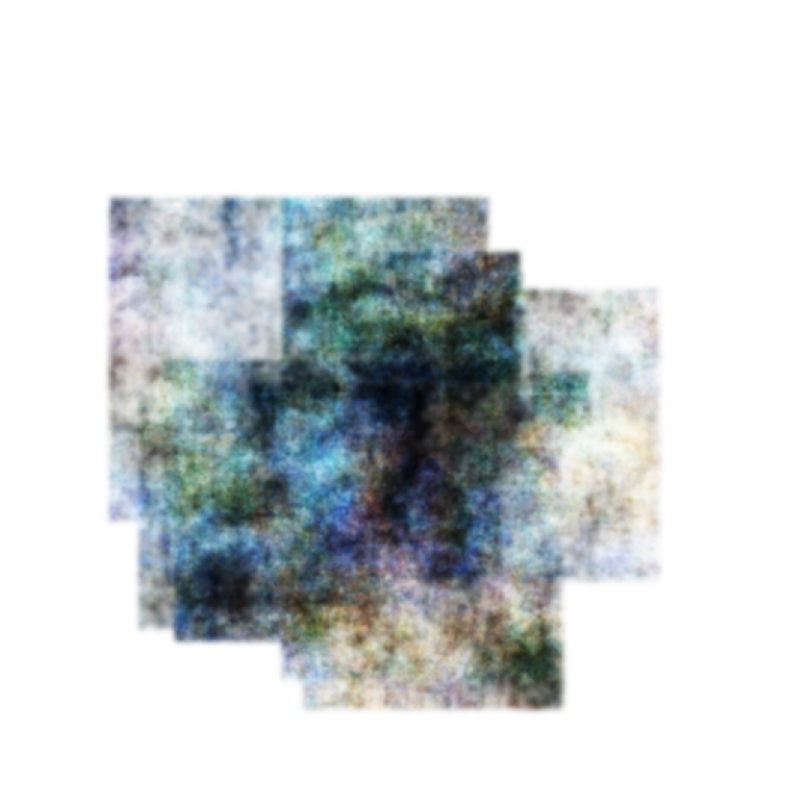

  5%|▌         | 10/199 [00:02<00:25,  7.46it/s]

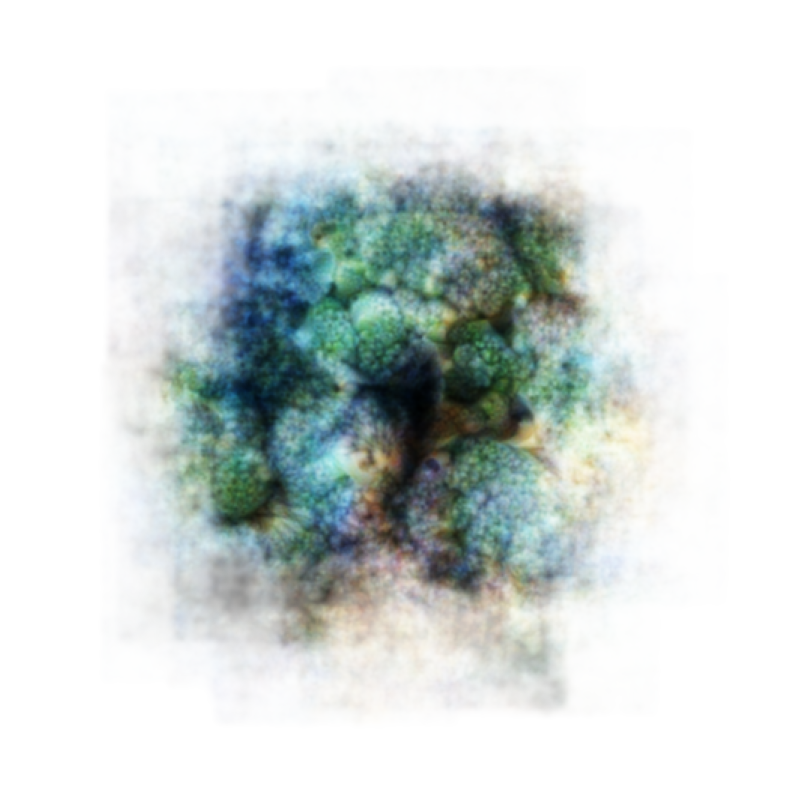

 10%|█         | 20/199 [00:04<00:21,  8.28it/s]

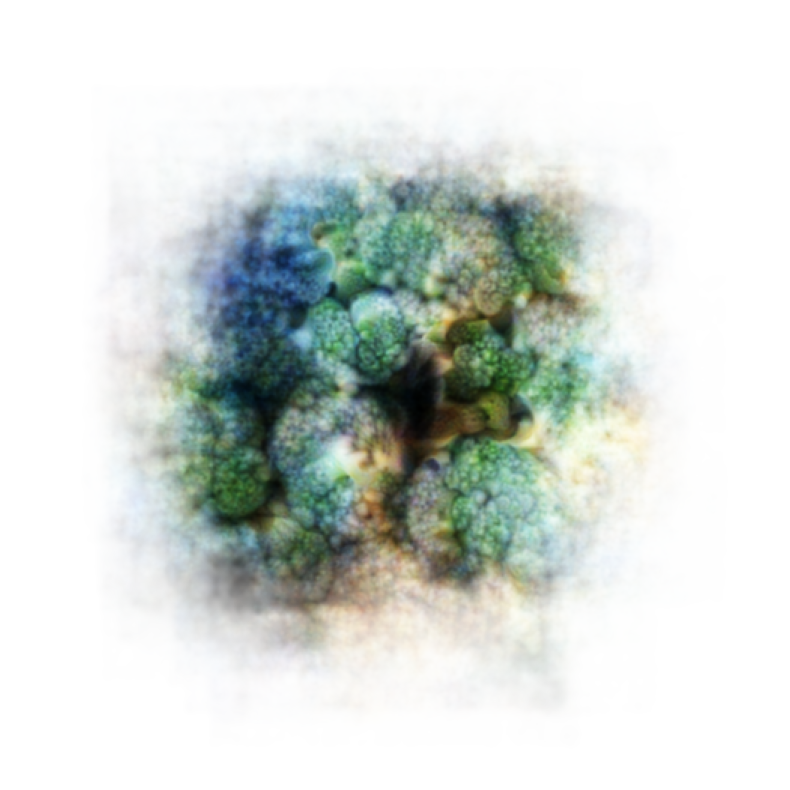

 15%|█▌        | 30/199 [00:05<00:20,  8.28it/s]

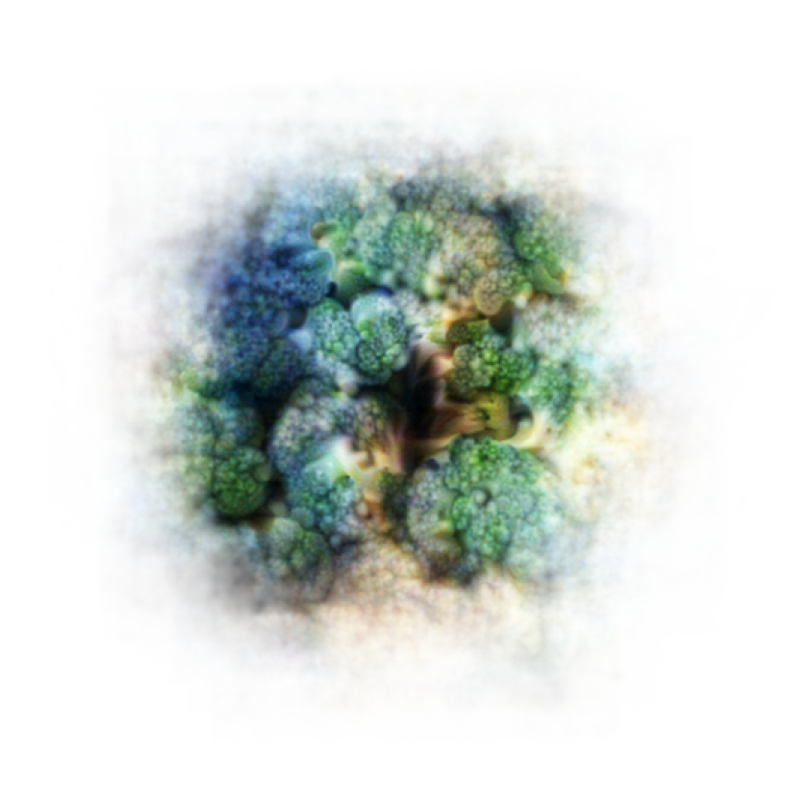

 20%|██        | 40/199 [00:07<00:19,  8.35it/s]

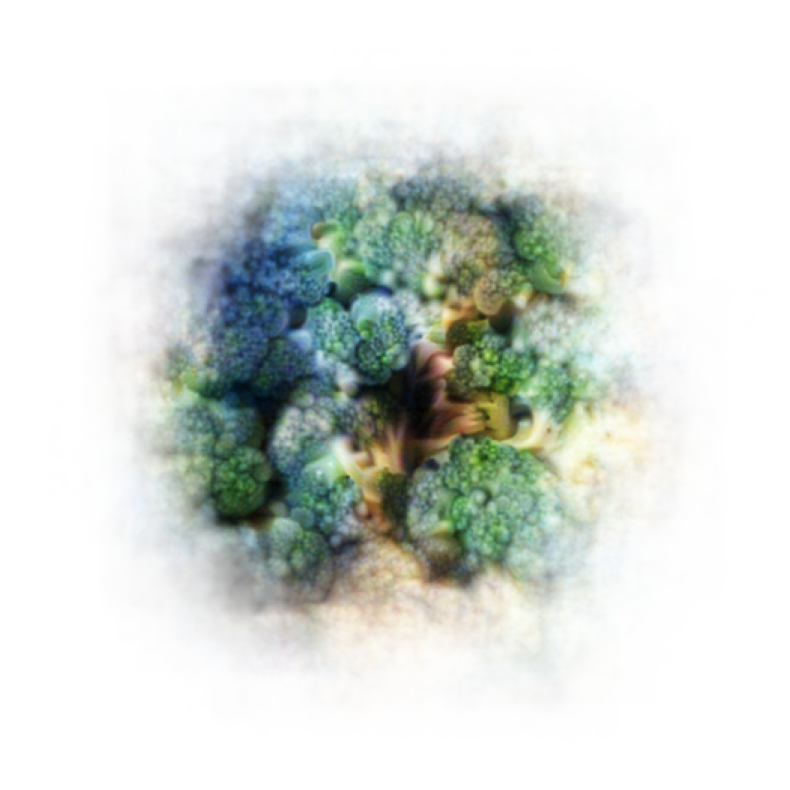

 25%|██▌       | 50/199 [00:09<00:17,  8.43it/s]

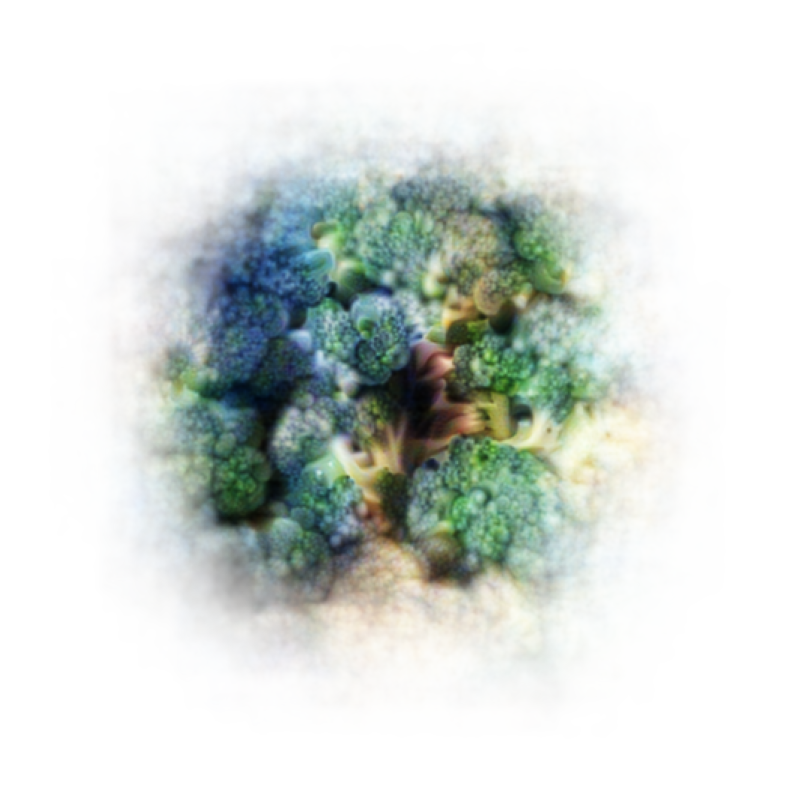

 30%|███       | 60/199 [00:10<00:16,  8.50it/s]

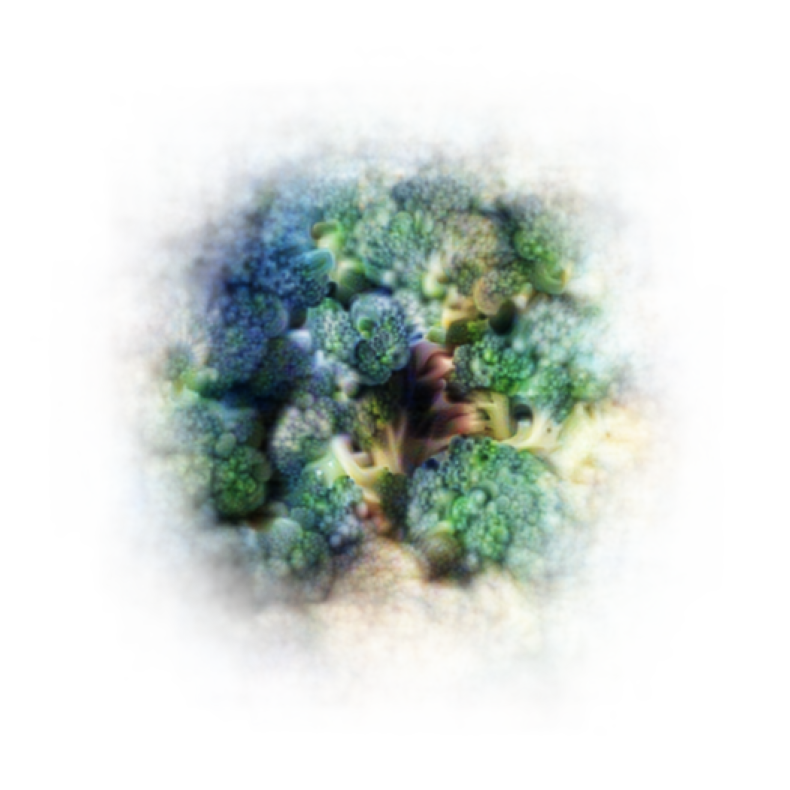

 35%|███▌      | 70/199 [00:12<00:15,  8.40it/s]

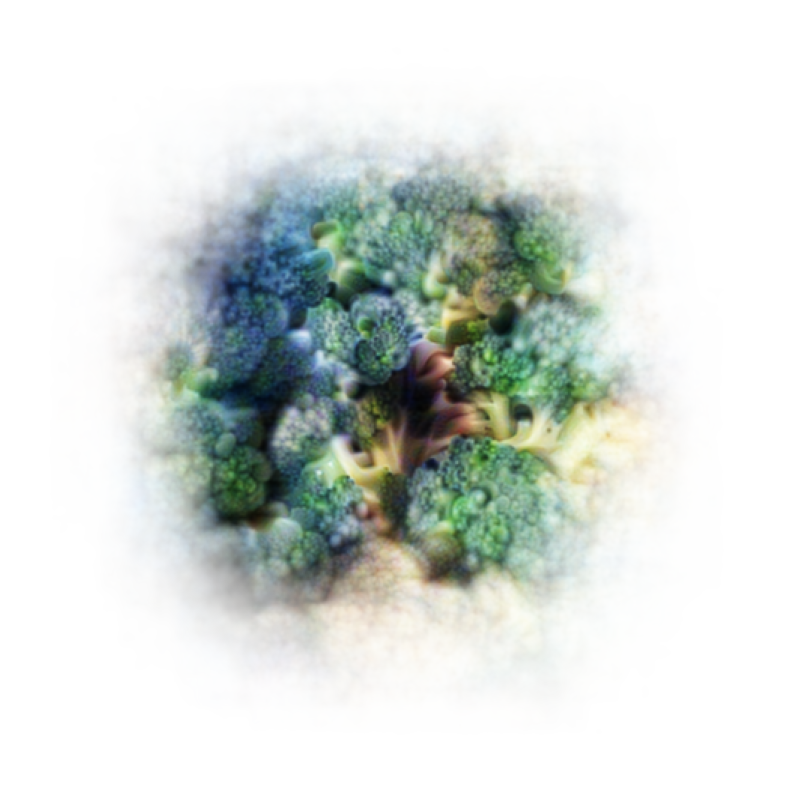

 40%|████      | 80/199 [00:13<00:14,  8.30it/s]

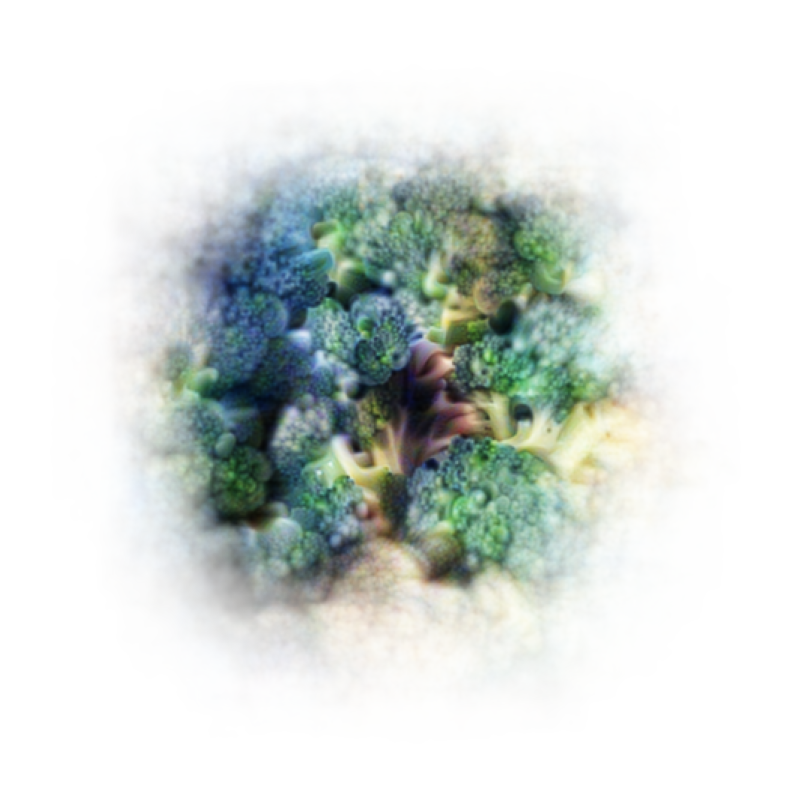

 45%|████▌     | 90/199 [00:15<00:12,  8.42it/s]

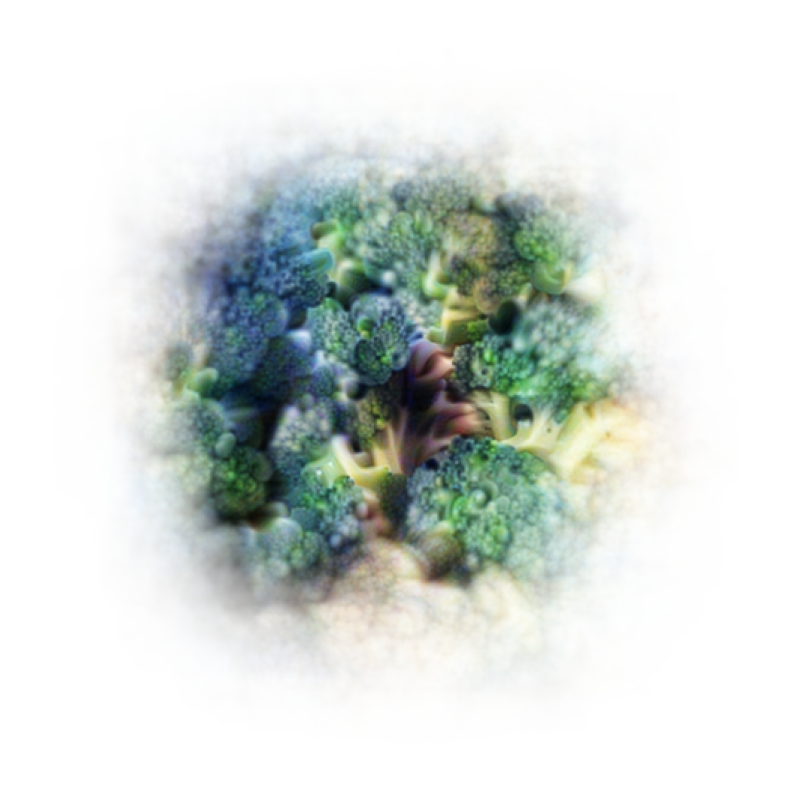

 50%|█████     | 100/199 [00:17<00:11,  8.44it/s]

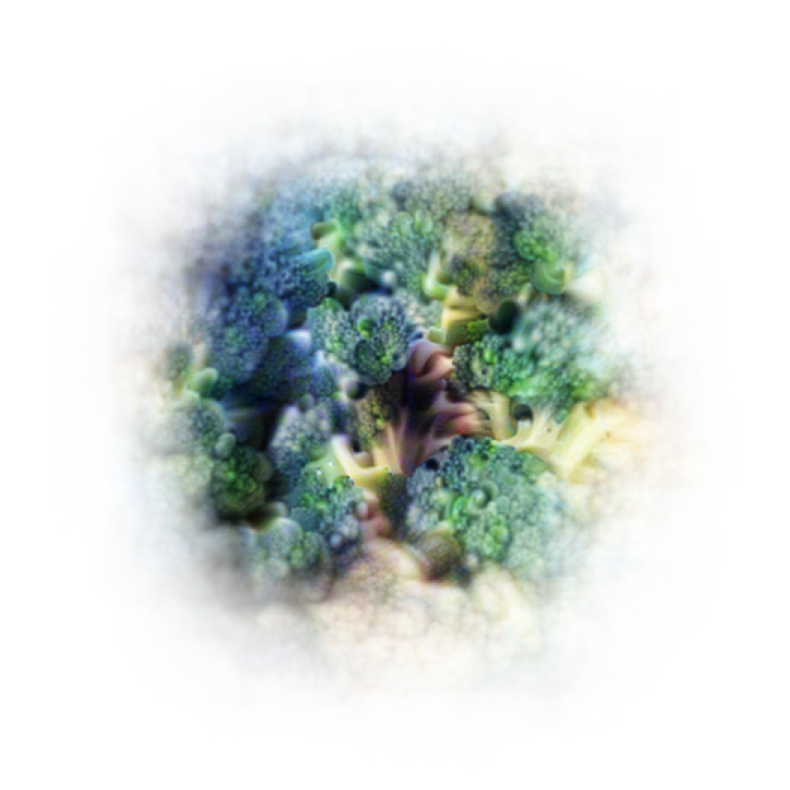

 55%|█████▌    | 110/199 [00:18<00:10,  8.24it/s]

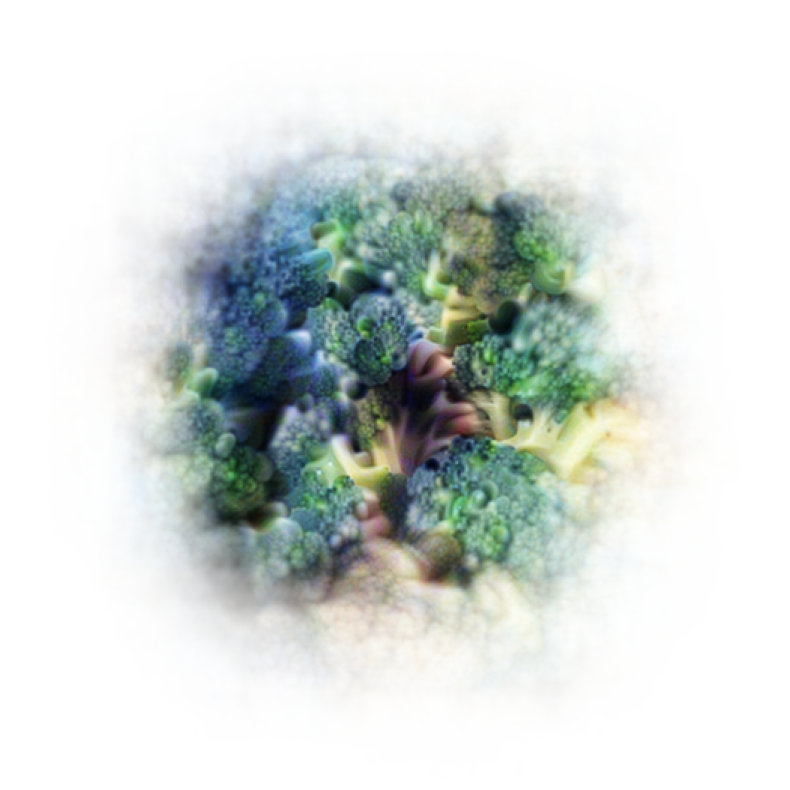

 60%|██████    | 120/199 [00:20<00:09,  8.24it/s]

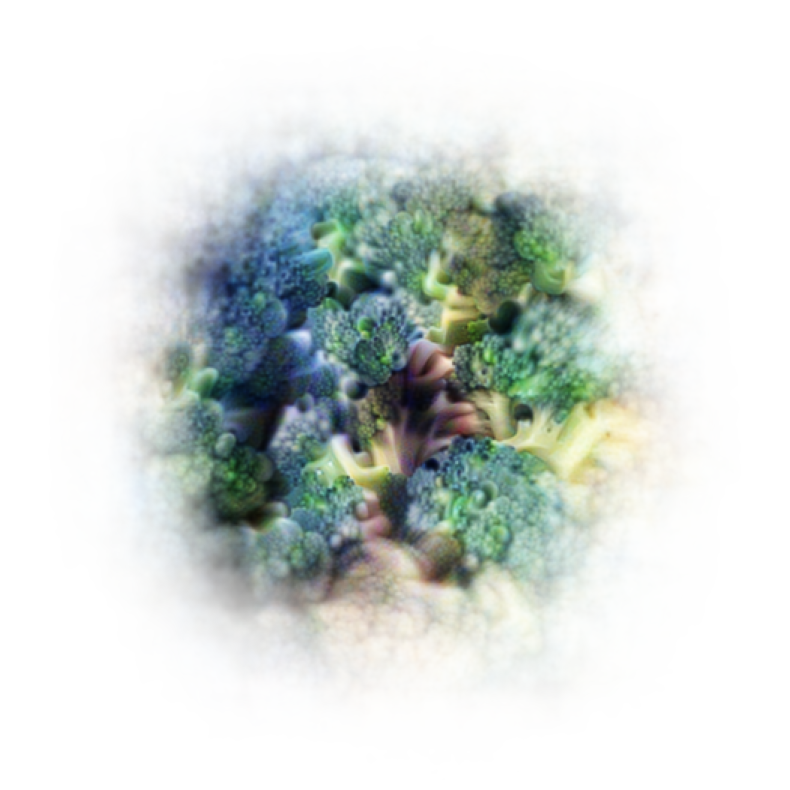

 65%|██████▌   | 130/199 [00:22<00:08,  8.06it/s]

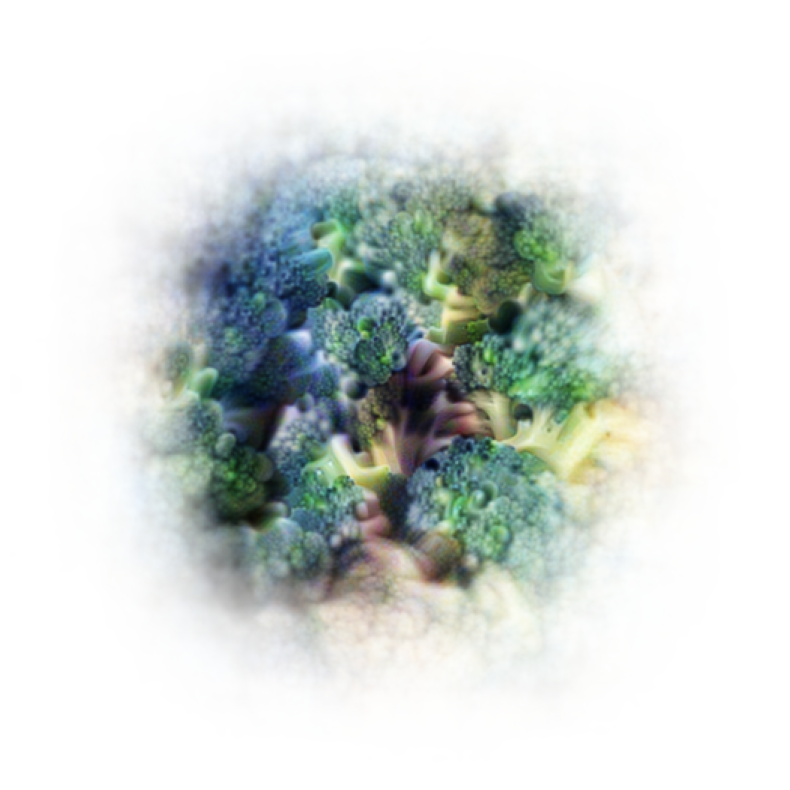

 70%|███████   | 140/199 [00:23<00:07,  8.41it/s]

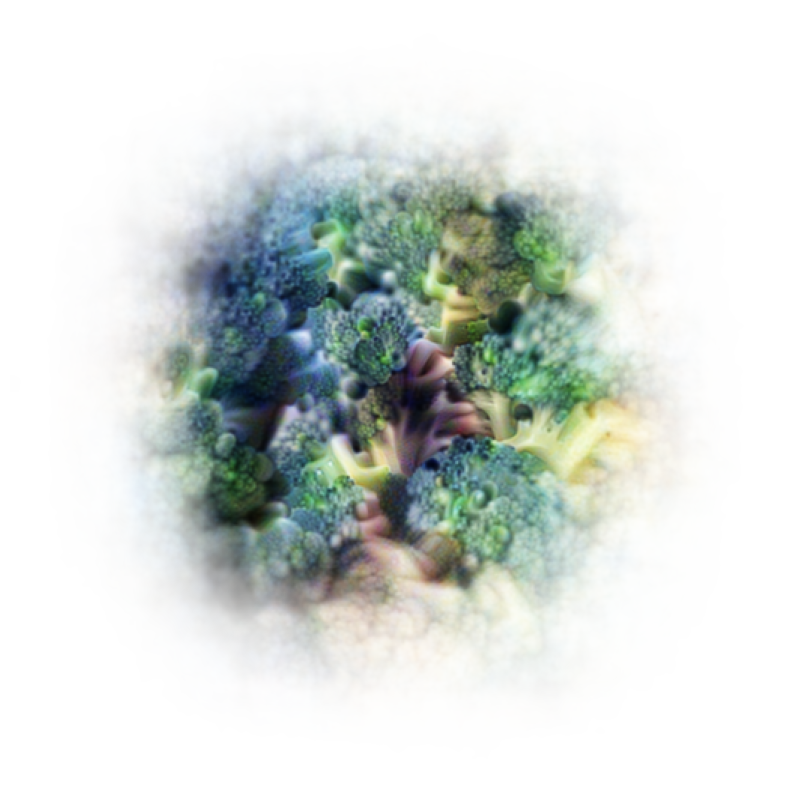

 75%|███████▌  | 150/199 [00:25<00:05,  8.35it/s]

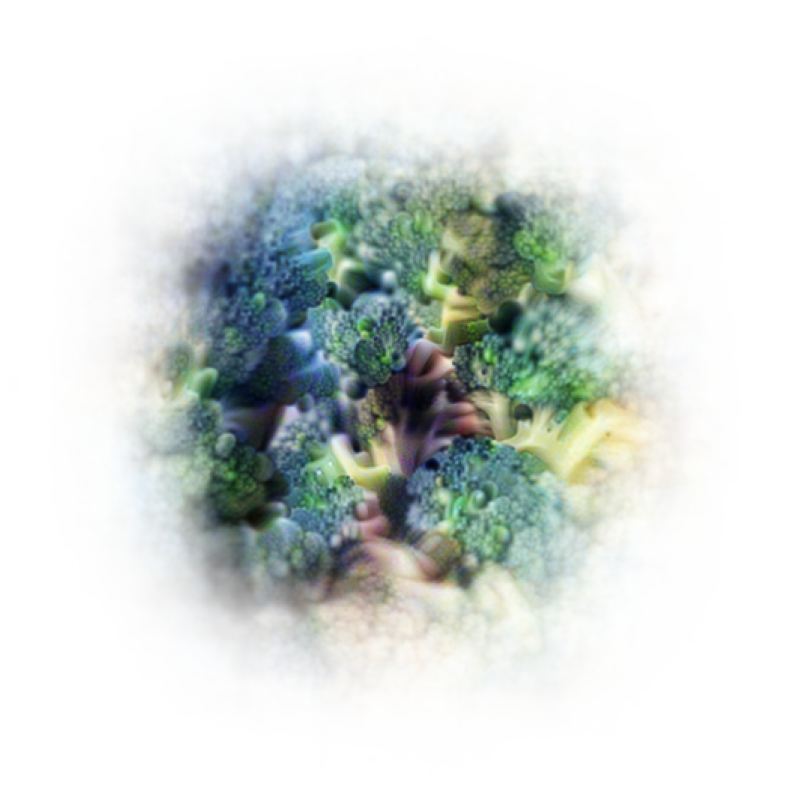

 80%|████████  | 160/199 [00:26<00:04,  8.37it/s]

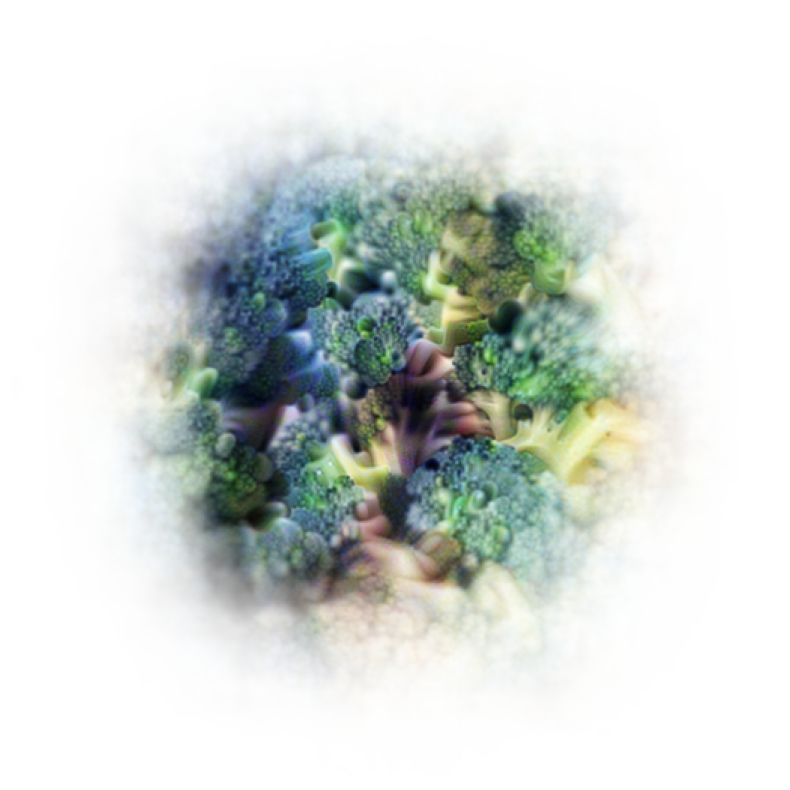

 85%|████████▌ | 170/199 [00:28<00:03,  8.25it/s]

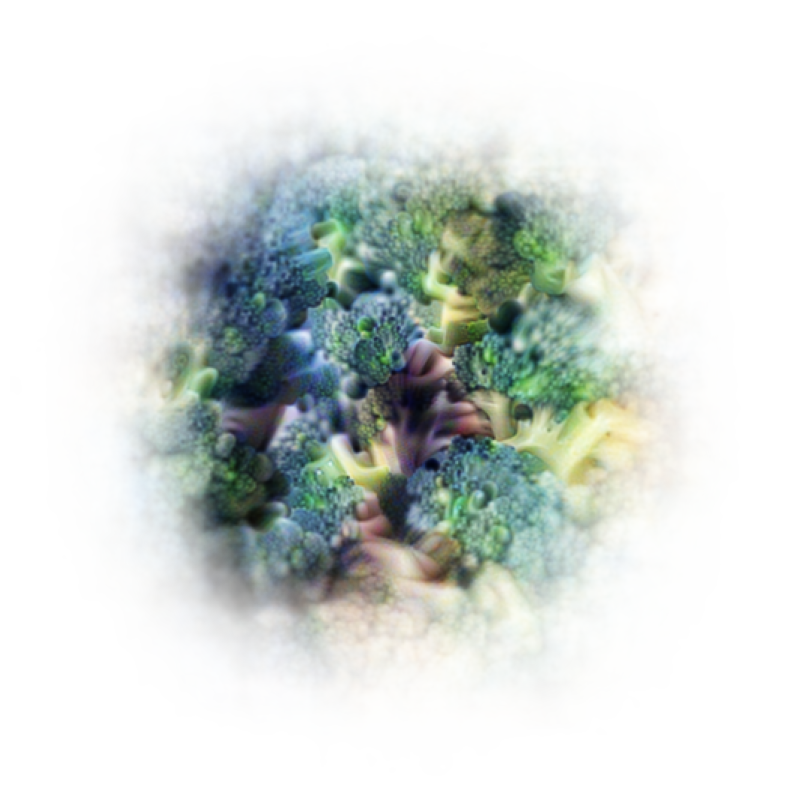

 90%|█████████ | 180/199 [00:30<00:02,  8.16it/s]

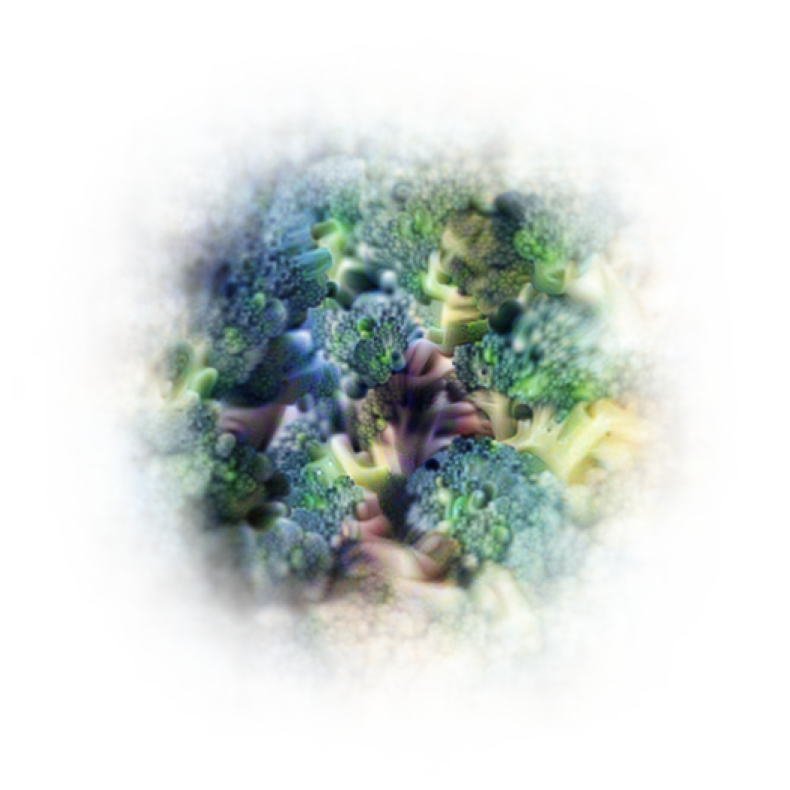

 95%|█████████▌| 190/199 [00:31<00:01,  8.19it/s]

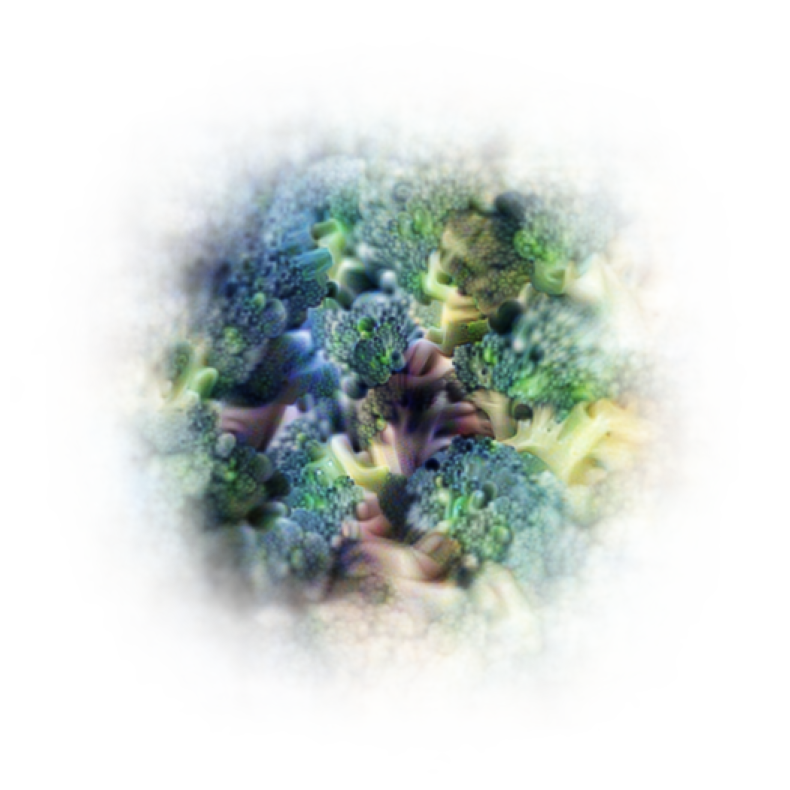

 99%|█████████▉| 198/199 [00:33<00:00,  7.79it/s]

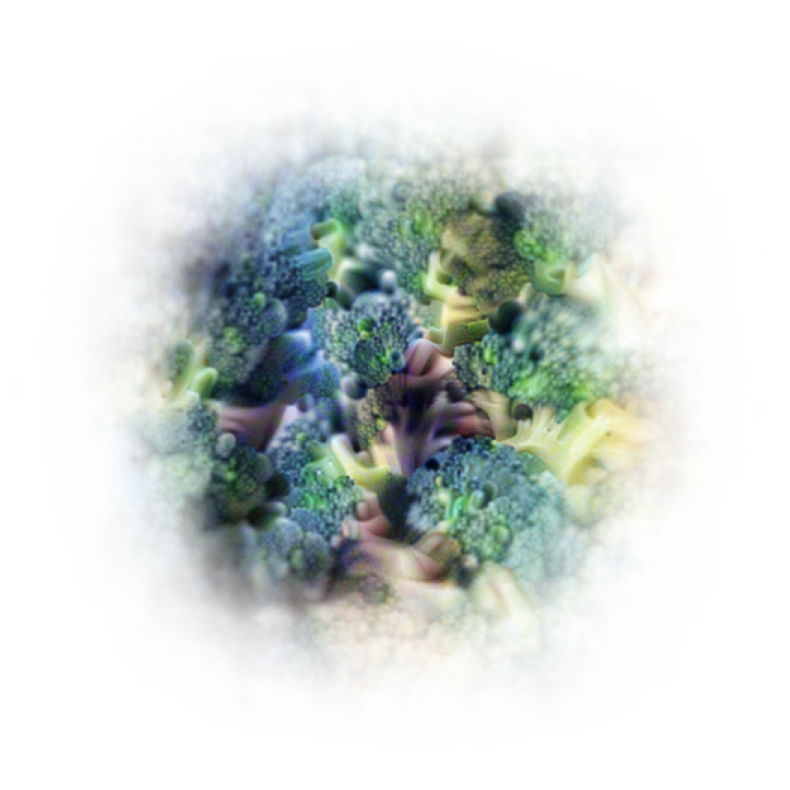

100%|██████████| 199/199 [00:33<00:00,  5.86it/s]


In [17]:
_ = render(resnet50_model, "labels:937")